#  DSC478 - Programming Machine Learning Applications
## Assignment 2 - Lavinia Wang

### Question 3. Data Analysis and Predictive Modeling on Census data

Dataset: <a href='http://facweb.cs.depaul.edu/mobasher/classes/CSC478/Data/adult-modified.csv'>adult_modified.csv</a> Dataset description <a href='https://archive.ics.uci.edu/ml/datasets/Adult'>here</a>

#### a. Preprocessing and data analysis: <br><br>Examine the data for missing values. In case of categorical attributes, remove instances with missing values. In the case of numeric attributes, impute and fill-in the missing values using the attribute mean.

In [1]:
# Import Modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os

from sklearn import preprocessing
from sklearn import neighbors, tree, naive_bayes
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import cross_validation

/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [5]:
# Change working directory
os.chdir('/Users/lavinia/Google Drive/18winter-textbooks/CSC478/Assignment2')

In [6]:
# Load file via read_csv
adult_df = pd.read_csv("adult-modified.csv")
adult_df.head(5)

,age,workclass,education,marital-status,race,sex,hours-per-week,income
0,39,Public,13,Single,White,Male,40,<=50K
1,50,Self-emp,13,Married,White,Male,13,<=50K
2,38,Private,9,Single,White,Male,40,<=50K
3,53,Private,7,Married,Black,Male,40,<=50K
4,28,Private,13,Married,Black,Female,40,<=50K


<b>Exploratory Data Analysis</b><br>
Understand the dataset and its variables

In [7]:
# Size of the dataset
adult_df.shape

(10000, 8)

In [8]:
# Summarize the variables
adult_df.describe(include='all')

,age,workclass,education,marital-status,race,sex,hours-per-week,income
count,10000,10000,10000.000000,10000,10000,10000,10000.000000,10000
unique,72,4,NaN,2,5,2,NaN,2
top,31,Private,NaN,Single,White,Male,NaN,<=50K
freq,284,6947,NaN,5017,8556,6703,NaN,7621
mean,NaN,NaN,10.076600,NaN,NaN,NaN,40.530300,NaN
std,NaN,NaN,2.548172,NaN,NaN,NaN,12.277197,NaN
min,NaN,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN
25%,NaN,NaN,9.000000,NaN,NaN,NaN,40.000000,NaN
50%,NaN,NaN,10.000000,NaN,NaN,NaN,40.000000,NaN
75%,NaN,NaN,12.000000,NaN,NaN,NaN,45.000000,NaN


In [9]:
# Find missing values in the dataset
adult_df.isnull().sum()

age               0
workclass         0
education         0
marital-status    0
race              0
sex               0
hours-per-week    0
income            0
dtype: int64

Look at the csv file then we find out that missing valus are marked w/ '?'. Locate the columns with missing values.

In [10]:
adult_df.isin(['?']).any()

age                True
workclass          True
education         False
marital-status    False
race              False
sex               False
hours-per-week    False
income            False
dtype: bool

In [11]:
# Change missing numeric values to column mean
adult_df.age[adult_df['age'] == '?'] = int(adult_df.age[adult_df['age'] != '?'].astype(int).mean())
#adult_df.head(20)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [12]:
# Replace the '?' with NA in the categorical columns
adult_dfNew = adult_df.replace('?', np.NaN)
# Drop the NAs
adult_dfNew = adult_dfNew.dropna()
adult_dfNew.shape

(9412, 8)

#### Question: Examine the characteristics of the attributes, including relevant statistics for each attribute, histograms illustrating the distribtions of numeric attributes, bar graphs showing value counts for categorical attributes, etc.

In [13]:
adult_dfNew.dtypes

age               object
workclass         object
education          int64
marital-status    object
race              object
sex               object
hours-per-week     int64
income            object
dtype: object

In [14]:
adult_dfNew.age = adult_dfNew.age.apply(int)

In [15]:
adult_dfNew.describe(include='all')

,age,workclass,education,marital-status,race,sex,hours-per-week,income
count,9412.000000,9412,9412.000000,9412,9412,9412,9412.000000,9412
unique,NaN,3,NaN,2,5,2,NaN,2
top,NaN,Private,NaN,Married,White,Male,NaN,<=50K
freq,NaN,6947,NaN,4737,8062,6383,NaN,7093
mean,38.357310,NaN,10.125266,NaN,NaN,NaN,41.080217,NaN
std,12.962135,NaN,2.542118,NaN,NaN,NaN,11.884590,NaN
min,17.000000,NaN,1.000000,NaN,NaN,NaN,1.000000,NaN
25%,28.000000,NaN,9.000000,NaN,NaN,NaN,40.000000,NaN
50%,37.000000,NaN,10.000000,NaN,NaN,NaN,40.000000,NaN
75%,47.000000,NaN,13.000000,NaN,NaN,NaN,45.000000,NaN


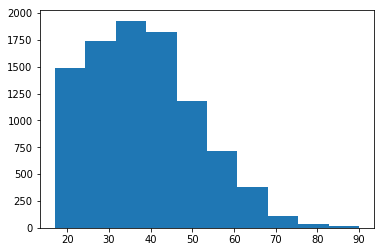

In [16]:
# Histogram showing the distribution of age
adult_dfNew['age'].hist(grid = False)

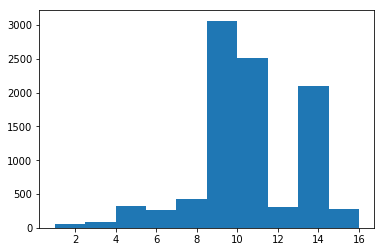

In [17]:
# Histogram showing the distribution of education
adult_dfNew['education'].hist(grid = False)

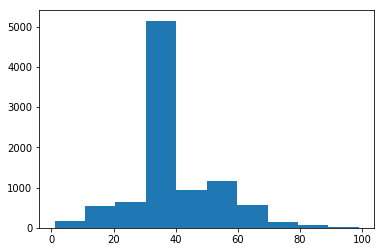

In [18]:
# Histogram showing the distribution of hours-per-week
adult_dfNew['hours-per-week'].hist(grid = False)

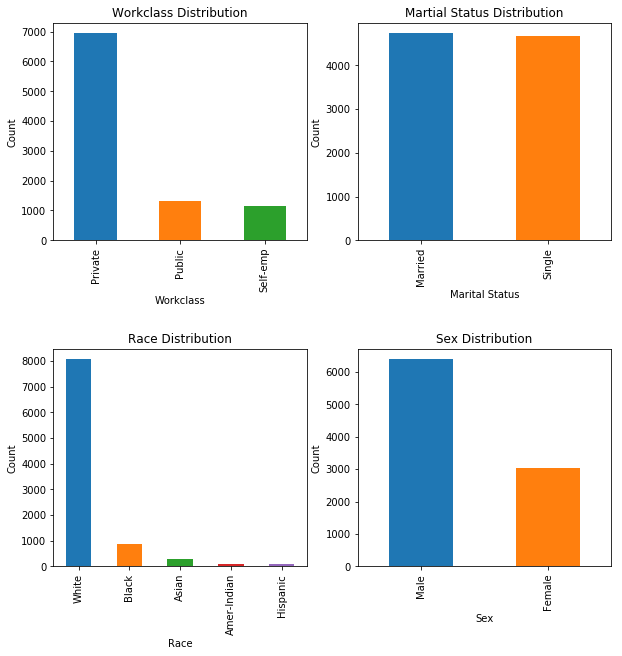

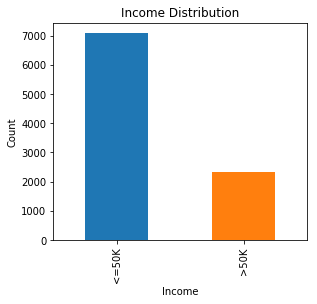

In [19]:
fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=.5)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Workclass')
ax1.set_ylabel('Count')
ax1.set_title("Workclass Distribution")
adult_dfNew['workclass'].value_counts().plot(kind = 'bar', grid = False)

ax1 = fig.add_subplot(222)
ax1.set_xlabel('Marital Status')
ax1.set_ylabel('Count')
ax1.set_title("Martial Status Distribution")
adult_dfNew['marital-status'].value_counts().plot(kind = 'bar', grid = False)


ax1 = fig.add_subplot(223)
ax1.set_xlabel('Race')
ax1.set_ylabel('Count')
ax1.set_title("Race Distribution")
adult_dfNew['race'].value_counts().plot(kind='bar', grid = False)

ax1 = fig.add_subplot(224)
ax1.set_xlabel('Sex')
ax1.set_ylabel('Count')
ax1.set_title("Sex Distribution")
adult_dfNew['sex'].value_counts().plot(kind='bar', grid = False)

fig2 = plt.figure(figsize=(10,10))
fig2.subplots_adjust(hspace=.5)

ax1 = fig2.add_subplot(221)
ax1.set_xlabel('Income')
ax1.set_ylabel('Count')
ax1.set_title("Income Distribution")
adult_dfNew['income'].value_counts().plot(kind='bar', grid = False)

#### Question: Perform the following cross-tabulations (including generating bar charts): education+race, workclass+income, work-class+race, and race+income. In the latter case (race+income) also create a table or chart showing percentages of each race category that fall in the low-income group. Discuss your observations from this analysis.

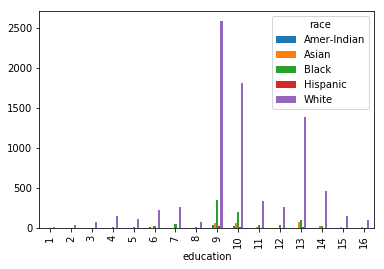

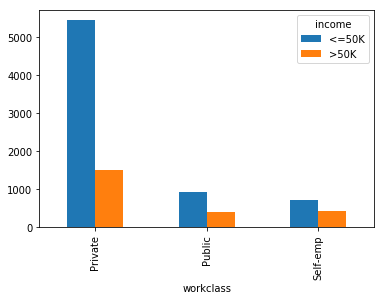

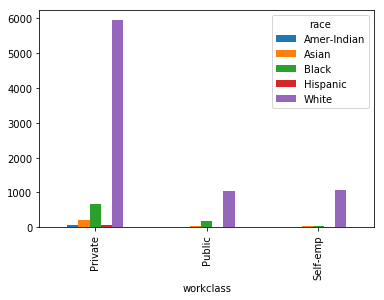

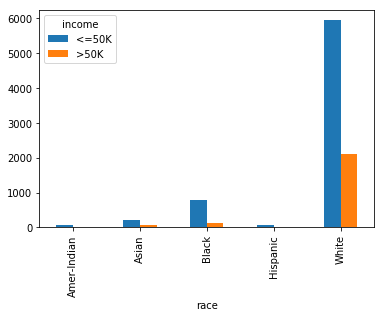

In [20]:
def generate_crosstab(first, second):
    cross_tab = pd.crosstab(adult_dfNew[first], adult_dfNew[second])
    plt.show(cross_tab.plot(kind="bar"))

generate_crosstab('education', 'race')
generate_crosstab('workclass', 'income')
generate_crosstab('workclass', 'race')
generate_crosstab('race', 'income')

In [21]:
# Create a table or chart showing percentages of each race category that fall in the low-income group.
pd.crosstab(adult_dfNew.race, adult_dfNew.income).apply(lambda x: x/x.sum(), axis = 1)

income,<=50K,>50K
race,,
Amer-Indian,0.902174,0.097826
Asian,0.769759,0.230241
Black,0.866592,0.133408
Hispanic,0.920000,0.080000
White,0.737286,0.262714


<b>So for each of the race we can see that most of the records n this data set are under low-income category. If we talk about each race, for the race Amer-Indian 90% of them are under low-income and around 10% are under high-income category, 77% of Asian are under low income category while 23% of them are under high-income category. For Black 87% are under low-income group and 13% are under high-income. For Hispanic 92% have income less than or equal to 50k so they are under low-income group while only 8% are in high-income category. For White 73% are under low-income category and 27% are under high-income category. Among all the races, in terms of race, highest percentage of people in low-income category are Hispanic and highest percentage of people under high-income category are White.</b>

#### Question: Compare and contrast the characteristics of the low-income and high-income categories across the different attributes.

In [22]:
# Workclass vs income
pd.crosstab(adult_dfNew.workclass, adult_dfNew.income).apply(lambda x: x/x.sum(), axis = 1)

income,<=50K,>50K
workclass,,
Private,0.783504,0.216496
Public,0.702354,0.297646
Self-emp,0.631533,0.368467


In [23]:
# Workclass vs income
pd.crosstab(adult_dfNew.workclass, adult_dfNew.income).apply(lambda x: x/x.sum(), axis = 1)

income,<=50K,>50K
workclass,,
Private,0.783504,0.216496
Public,0.702354,0.297646
Self-emp,0.631533,0.368467


In [24]:
# Marital vs income
pd.crosstab(adult_dfNew['marital-status'], adult_dfNew.income).apply(lambda x: x/x.sum(), axis = 1)

income,<=50K,>50K
marital-status,,
Married,0.576314,0.423686
Single,0.933262,0.066738


In [25]:
# Sex vs income
pd.crosstab(adult_dfNew.sex, adult_dfNew.income).apply(lambda x: x/x.sum(), axis = 1)

income,<=50K,>50K
sex,,
Female,0.881149,0.118851
Male,0.693091,0.306909


<b>From the analysis above, we see that members of the private class are most likely to make less than 50k, whereas those who are self employed are more likely to make over 50k. Even more notably, single people are signifcantly more likely to make less than 50k (93.33%) than married people (57.63%). Finally, 30% of males make more than 50k where only 11.89% of females make more than 50k.</b>

#### b. Predictive Modeling and Model Evaluation: <br><br>Using either Pandas or Scikit-learn, create dummy variables for the categorical attributes. Then separate the target attribute ("income_>50K") from the attributes used for training. [Note: you need to drop "income_<=50K" which is also created as a dummy variable in earlier steps).]

In [26]:
#  Create dummy variables for the categorical attributes. Then separate the target attribute ("income>50K") from the attributes used for training.
adult_dfNew = pd.get_dummies(adult_dfNew)
adult_dfNew.head(5)

,age,education,hours-per-week,workclass_Private,workclass_Public,workclass_Self-emp,marital-status_Married,marital-status_Single,race_Amer-Indian,race_Asian,race_Black,race_Hispanic,race_White,sex_Female,sex_Male,income_<=50K,income_>50K
0,39,13,40,0,1,0,0,1,0,0,0,0,1,0,1,1,0
1,50,13,13,0,0,1,1,0,0,0,0,0,1,0,1,1,0
2,38,9,40,1,0,0,0,1,0,0,0,0,1,0,1,1,0
3,53,7,40,1,0,0,1,0,0,0,1,0,0,0,1,1,0
4,28,13,40,1,0,0,1,0,0,0,1,0,0,1,0,1,0


In [27]:
# Drop income <=50K
adult_dfNew = adult_dfNew.drop('income_<=50K', 1)
adult_dfNew.head(5)

,age,education,hours-per-week,workclass_Private,workclass_Public,workclass_Self-emp,marital-status_Married,marital-status_Single,race_Amer-Indian,race_Asian,race_Black,race_Hispanic,race_White,sex_Female,sex_Male,income_>50K
0,39,13,40,0,1,0,0,1,0,0,0,0,1,0,1,0
1,50,13,13,0,0,1,1,0,0,0,0,0,1,0,1,0
2,38,9,40,1,0,0,0,1,0,0,0,0,1,0,1,0
3,53,7,40,1,0,0,1,0,0,0,1,0,0,0,1,0
4,28,13,40,1,0,0,1,0,0,0,1,0,0,1,0,0


In [28]:
# Seperate target attribute ("income>50K") from the attributes used for training.
y = adult_dfNew['income_>50K']
y.head()

0    0
1    0
2    0
3    0
4    0
Name: income_>50K, dtype: uint8

In [29]:
# Remove target from rest of set
adult_dfNew = adult_dfNew.drop('income_>50K', 1)
adult_dfNew.head()

,age,education,hours-per-week,workclass_Private,workclass_Public,workclass_Self-emp,marital-status_Married,marital-status_Single,race_Amer-Indian,race_Asian,race_Black,race_Hispanic,race_White,sex_Female,sex_Male
0,39,13,40,0,1,0,0,1,0,0,0,0,1,0,1
1,50,13,13,0,0,1,1,0,0,0,0,0,1,0,1
2,38,9,40,1,0,0,0,1,0,0,0,0,1,0,1
3,53,7,40,1,0,0,1,0,0,0,1,0,0,0,1
4,28,13,40,1,0,0,1,0,0,0,1,0,0,1,0


#### Question: Use scikit-learn to build classifiers uisng Naive Bayes (Gaussian), decision tree (using "entropy" as selection criteria), and linear discriminant analysis (LDA). For each of these perform 10-fold crossvalidation (using cross-validation module in scikit-learn) and report the overall average accuracy.

In [30]:
# (Gaussian) naive Bayes classifier
nbclf = naive_bayes.GaussianNB()
nbclf = nbclf.fit(adult_dfNew, y)

cv_scores = cross_validation.cross_val_score(nbclf, adult_dfNew, y, cv = 10)
cv_scores
print("Overall Accuracy: %0.2f (+/- %0.2f)" % (cv_scores.mean(), cv_scores.std() * 2))

Overall Accuracy: 0.72 (+/- 0.02)


In [31]:
# Decision tree classifier
treeclf = tree.DecisionTreeClassifier(criterion = 'entropy', random_state = 9)
treeclf = treeclf.fit(adult_dfNew, y)

cv_scores = cross_validation.cross_val_score(treeclf, adult_dfNew, y, cv = 10)
cv_scores
print("Overall Accuracy: %0.2f (+/- %0.2f)" % (cv_scores.mean(), cv_scores.std() * 2))

Overall Accuracy: 0.76 (+/- 0.02)


In [32]:
# Linear Discriminant Analysis(LDA)
ldclf = LinearDiscriminantAnalysis()
ldclf = ldclf.fit(adult_dfNew, y)

cv_scores = cross_validation.cross_val_score(ldclf, adult_dfNew, y, cv = 10)
cv_scores
print("Overall Accuracy: %0.2f (+/- %0.2f)" % (cv_scores.mean(), cv_scores.std() * 2))

Overall Accuracy: 0.81 (+/- 0.02)


/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.6/site-packages/sklearn/discriminant_analysis.py:388: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")
/anaconda3/lib/python3.6/site-packages/sklearn

#### Question: For the decision tree model (generated on the full training data), generate a visualization of tree and submit it as a separate file (png, jpg, or pdf) or embed it in the Jupyter Notebook.

In [33]:
from sklearn.tree import export_graphviz
export_graphviz(treeclf,out_file='tree.dot', feature_names = adult_dfNew.columns)

In [35]:
import graphviz

with open("tree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

In [36]:
system(dot -Tpng tree.dot -o dtree.png)

['dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.385462 to fit']

In [37]:
from IPython.display import Image
Image(filename='dtree.png', width=800)